# **House Price Prediction**

You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

### **Data Preperation**
Import the required libaries in python


In [1]:
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import r2_score, mean_squared_error

import math
import warnings

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


warnings.filterwarnings("ignore")

Load the input data to the dataframe pd_housprice

In [2]:
pd_housprice = pd.read_csv("train.csv")

In [3]:
pd_housprice.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
pd_housprice.shape

(1460, 81)

In [5]:
pd_housprice.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
pd_housprice.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [7]:
pd_housprice.isna()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
1,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
2,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
3,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
4,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False
1456,False,False,False,False,False,False,True,False,False,False,...,False,True,False,True,False,False,False,False,False,False
1457,False,False,False,False,False,False,True,False,False,False,...,False,True,False,False,False,False,False,False,False,False
1458,False,False,False,False,False,False,True,False,False,False,...,False,True,True,True,False,False,False,False,False,False


## **DataCleaning**

Remove the Id	 which is not required from the pd_housprice dataframe

In [8]:
pd_housprice = pd_housprice.drop("Id", axis=1)
pd_housprice.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


Remove all the NA in the numerical type list

In [9]:
Numerical_type = [
    "LotFrontage",
    "LotArea",
    "OverallQual",
    "OverallCond",
    "YearBuilt",
    "YearBuilt",
    "YearRemodAdd",
    "MasVnrArea",
    "BsmtFinSF1",
    "BsmtUnfSF",
    "TotalBsmtSF",
    "1stFlrSF",
    "2ndFlrSF",
    "LowQualFinSF",
    "GrLivArea",
    "BsmtFullBath",
    "BsmtHalfBath",
    "BsmtFinSF2",
    "FullBath",
    "HalfBath",
    "BedroomAbvGr",
    "KitchenAbvGr",
    "TotRmsAbvGrd",
    "Fireplaces",
    "GarageYrBlt",
    "GarageCars",
    "GarageArea",
    "WoodDeckSF",
    "OpenPorchSF",
    "EnclosedPorch",
    "3SsnPorch",
    "ScreenPorch",
    "PoolArea",
    "MiscVal",
    "MoSold",
    "YrSold",
    "SalePrice",
]
for num_type in Numerical_type:
    print(pd_housprice[num_type].isna().value_counts())

False    1201
True      259
Name: LotFrontage, dtype: int64
False    1460
Name: LotArea, dtype: int64
False    1460
Name: OverallQual, dtype: int64
False    1460
Name: OverallCond, dtype: int64
False    1460
Name: YearBuilt, dtype: int64
False    1460
Name: YearBuilt, dtype: int64
False    1460
Name: YearRemodAdd, dtype: int64
False    1452
True        8
Name: MasVnrArea, dtype: int64
False    1460
Name: BsmtFinSF1, dtype: int64
False    1460
Name: BsmtUnfSF, dtype: int64
False    1460
Name: TotalBsmtSF, dtype: int64
False    1460
Name: 1stFlrSF, dtype: int64
False    1460
Name: 2ndFlrSF, dtype: int64
False    1460
Name: LowQualFinSF, dtype: int64
False    1460
Name: GrLivArea, dtype: int64
False    1460
Name: BsmtFullBath, dtype: int64
False    1460
Name: BsmtHalfBath, dtype: int64
False    1460
Name: BsmtFinSF2, dtype: int64
False    1460
Name: FullBath, dtype: int64
False    1460
Name: HalfBath, dtype: int64
False    1460
Name: BedroomAbvGr, dtype: int64
False    1460
Name: KitchenA

In [10]:
pd_housprice = pd_housprice.dropna(subset=["LotFrontage", "MasVnrArea", "GarageYrBlt"])

In [11]:
pd_housprice[Numerical_type].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1121 entries, 0 to 1459
Data columns (total 37 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   LotFrontage    1121 non-null   float64
 1   LotArea        1121 non-null   int64  
 2   OverallQual    1121 non-null   int64  
 3   OverallCond    1121 non-null   int64  
 4   YearBuilt      1121 non-null   int64  
 5   YearBuilt      1121 non-null   int64  
 6   YearRemodAdd   1121 non-null   int64  
 7   MasVnrArea     1121 non-null   float64
 8   BsmtFinSF1     1121 non-null   int64  
 9   BsmtUnfSF      1121 non-null   int64  
 10  TotalBsmtSF    1121 non-null   int64  
 11  1stFlrSF       1121 non-null   int64  
 12  2ndFlrSF       1121 non-null   int64  
 13  LowQualFinSF   1121 non-null   int64  
 14  GrLivArea      1121 non-null   int64  
 15  BsmtFullBath   1121 non-null   int64  
 16  BsmtHalfBath   1121 non-null   int64  
 17  BsmtFinSF2     1121 non-null   int64  
 18  FullBath

Remove the NA in the Categorical variables which is necessary based on category

In [12]:
hous_columns = pd_housprice.columns.tolist()
categorical_type = [x for x in hous_columns if x not in Numerical_type]
len(categorical_type)

44

In [13]:
for categorical in categorical_type:
    print(pd_housprice[categorical].isna().value_counts())

False    1121
Name: MSSubClass, dtype: int64
False    1121
Name: MSZoning, dtype: int64
False    1121
Name: Street, dtype: int64
True     1044
False      77
Name: Alley, dtype: int64
False    1121
Name: LotShape, dtype: int64
False    1121
Name: LandContour, dtype: int64
False    1121
Name: Utilities, dtype: int64
False    1121
Name: LotConfig, dtype: int64
False    1121
Name: LandSlope, dtype: int64
False    1121
Name: Neighborhood, dtype: int64
False    1121
Name: Condition1, dtype: int64
False    1121
Name: Condition2, dtype: int64
False    1121
Name: BldgType, dtype: int64
False    1121
Name: HouseStyle, dtype: int64
False    1121
Name: RoofStyle, dtype: int64
False    1121
Name: RoofMatl, dtype: int64
False    1121
Name: Exterior1st, dtype: int64
False    1121
Name: Exterior2nd, dtype: int64
False    1121
Name: MasVnrType, dtype: int64
False    1121
Name: ExterQual, dtype: int64
False    1121
Name: ExterCond, dtype: int64
False    1121
Name: Foundation, dtype: int64
False    1097


In [14]:
pd_housprice = pd_housprice.dropna(subset=["Electrical"])

In [15]:
pd_housprice.shape

(1120, 80)

In [16]:
pd_housprice[categorical_type].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1120 entries, 0 to 1459
Data columns (total 44 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   MSSubClass     1120 non-null   int64 
 1   MSZoning       1120 non-null   object
 2   Street         1120 non-null   object
 3   Alley          77 non-null     object
 4   LotShape       1120 non-null   object
 5   LandContour    1120 non-null   object
 6   Utilities      1120 non-null   object
 7   LotConfig      1120 non-null   object
 8   LandSlope      1120 non-null   object
 9   Neighborhood   1120 non-null   object
 10  Condition1     1120 non-null   object
 11  Condition2     1120 non-null   object
 12  BldgType       1120 non-null   object
 13  HouseStyle     1120 non-null   object
 14  RoofStyle      1120 non-null   object
 15  RoofMatl       1120 non-null   object
 16  Exterior1st    1120 non-null   object
 17  Exterior2nd    1120 non-null   object
 18  MasVnrType     1120 non-null

Convert numerical data into categorical data '**MSSubClass**' from
20 to 	1-STORY 1946 & NEWER ALL STYLES,
30 to 	1-STORY 1945 & OLDER,
40 to 	1-STORY W/FINISHED ATTIC ALL AGES,
45 to	  1-1/2 STORY - UNFINISHED ALL AGES,
50 to 	1-1/2 STORY FINISHED ALL AGES,
60 to 	2-STORY 1946 & NEWER,
70 to 	2-STORY 1945 & OLDER,
75 to	  2-1/2 STORY ALL AGES,
80 to 	SPLIT OR MULTI-LEVEL,
85 to	  SPLIT FOYER,
90 to 	DUPLEX - ALL STYLES AND AGES,
120 to 	1-STORY PUD (Planned Unit Development) - 1946 & NEWER,
150 to 	1-1/2 STORY PUD - ALL AGES,
160 to 	2-STORY PUD - 1946 & NEWER,
180 to 	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER,
190 to 	2 FAMILY CONVERSION - ALL STYLES AND AGES. used abbrevation form above type sentences below

In [17]:
pd_housprice["MSSubClass"] = pd_housprice["MSSubClass"].map(
    {
        20: "1S1946NST",
        30: "1S1945OLD",
        40: "1SW/FAAA",
        45: "11/2SUAA",
        50: "11/2SFAA",
        60: "2S1946N",
        70: "2S1945&OLD",
        75: "21/2SAA",
        80: "SML",
        85: "SF",
        90: "DASAA",
        120: "1SP1946&N",
        150: "11/2SPAAG",
        160: "2SP1946NR",
        180: "PMISPLF",
        190: "2FCASAA",
    }
)

Remove outliers in SalePrice if price is greater than '550000' by the box plot analysis

In [18]:
pd_housprice = pd_housprice[-(pd_housprice["SalePrice"] > 600000)]

In [19]:
pd_housprice.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,2S1946N,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,1S1946NST,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,2S1946N,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,2S1945&OLD,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,2S1946N,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


Creating boxplot for categorical data

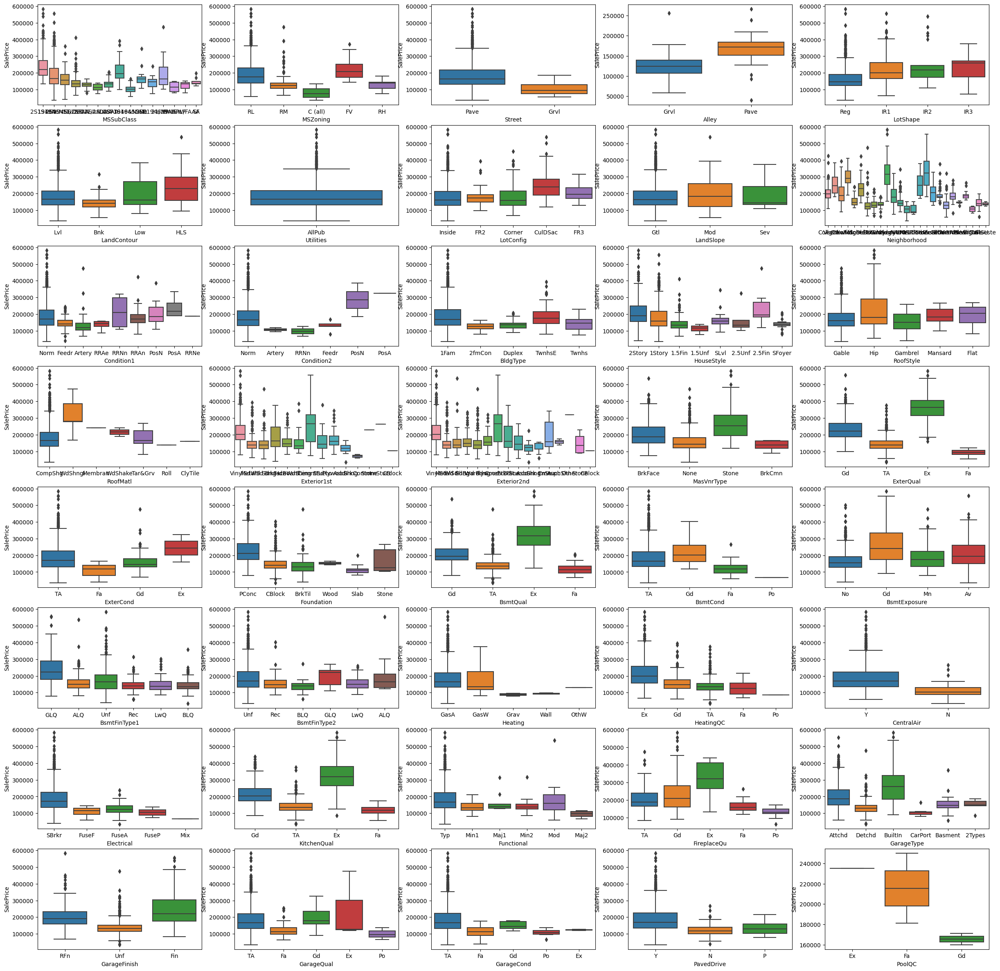

In [20]:
fig, axs = plt.subplots(8, 5, figsize=(30, 30))
count = 0
for i in range(0, 8):
    for j in range(0, 5):
        if count < len(categorical_type):
            cat_value = categorical_type[count]
            sns.boxplot(ax=axs[i, j], x=cat_value, y="SalePrice", data=pd_housprice)
        count += 1

plt.show()

Drop utilites from the dataframe based on the analysis of boxplot.

In [21]:
pd_housprice = pd_housprice.drop(labels=["Utilities"], axis=1)
categorical_type.remove("Utilities")

Create Bar chart for numerical data with the sale price

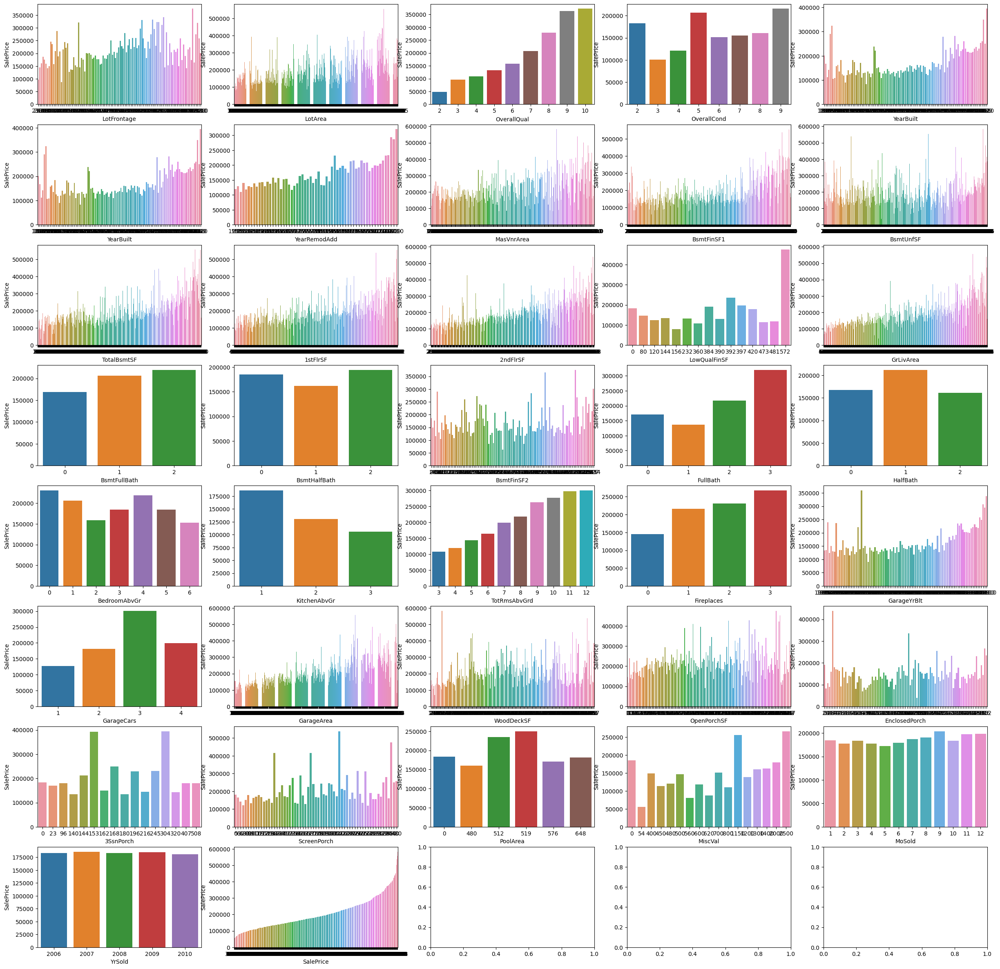

In [22]:
fig, axs = plt.subplots(8, 5, figsize=(30, 30))
count = 0
for i in range(0, 8):
    for j in range(0, 5):
        if count < len(Numerical_type):
            cat_value = Numerical_type[count]
            sns.barplot(
                ax=axs[i, j],
                x=pd_housprice[cat_value],
                y=pd_housprice["SalePrice"],
                ci=None,
            )
        count += 1

plt.show()

Converting categorical data variables into dummy variables and drop the categorical variables

In [23]:
for categorical in categorical_type:
    status = pd.get_dummies(pd_housprice[categorical], drop_first=True)
    status_index = status.columns.tolist()
    for columns in status_index:
        pd_housprice[columns] = status[columns]
    pd_housprice = pd_housprice.drop(categorical, axis=1)

In [24]:
pd_housprice.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1116 entries, 0 to 1459
Columns: 191 entries, LotFrontage to Partial
dtypes: float64(3), int64(33), uint8(155)
memory usage: 491.5 KB


Plotting Pair Plot Numerical type variables with SalePrice

LotFrontage


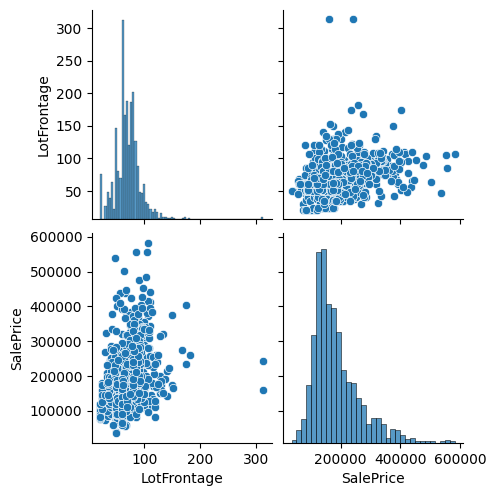

LotArea


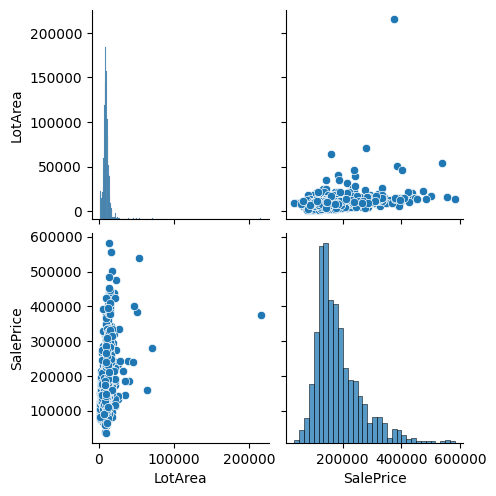

OverallQual


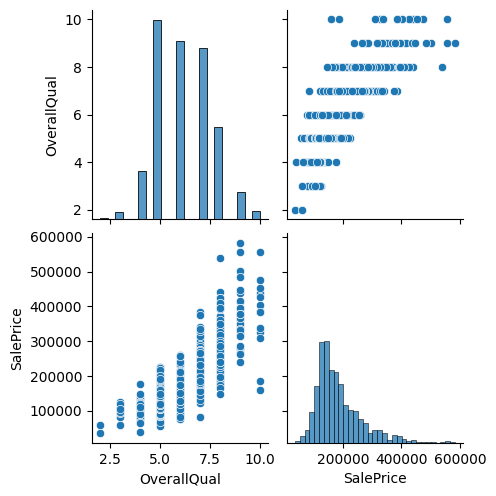

OverallCond


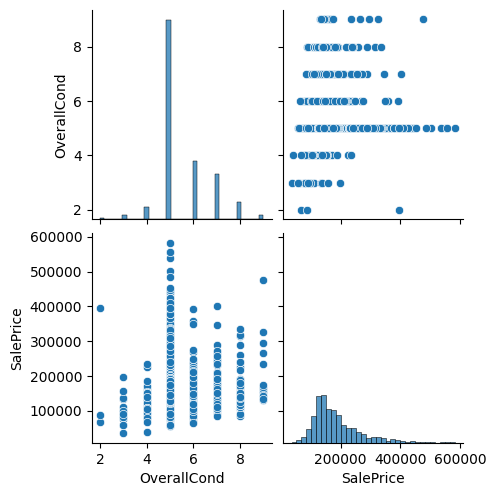

YearBuilt


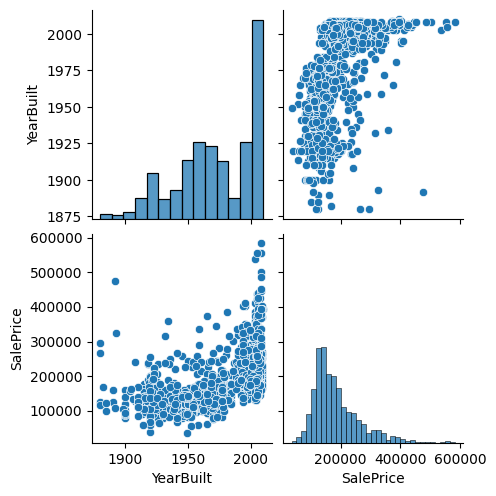

YearBuilt


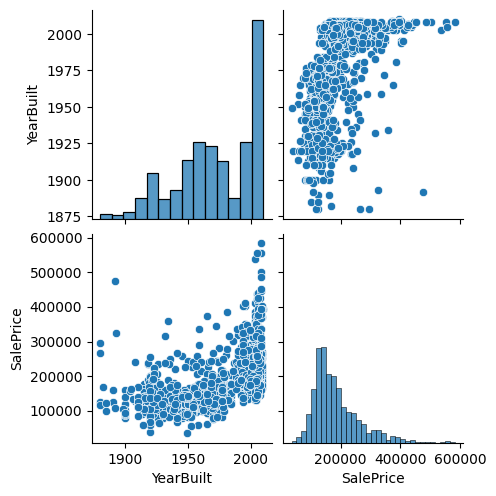

YearRemodAdd


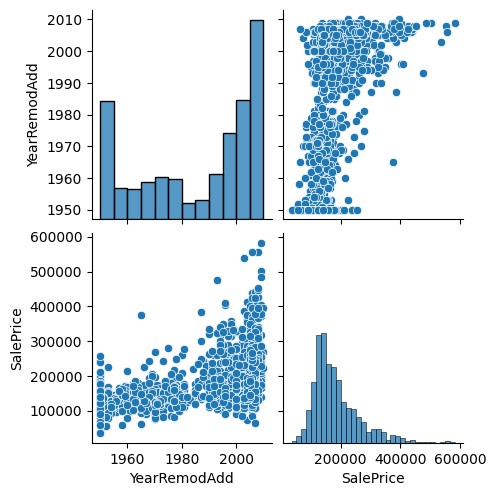

MasVnrArea


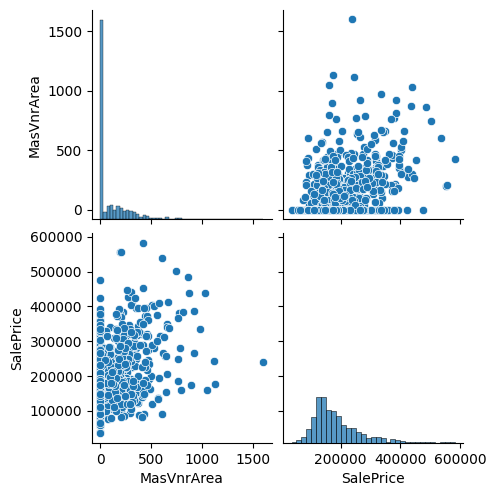

BsmtFinSF1


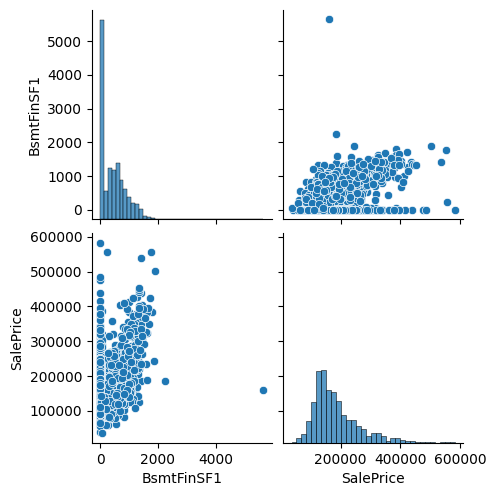

BsmtUnfSF


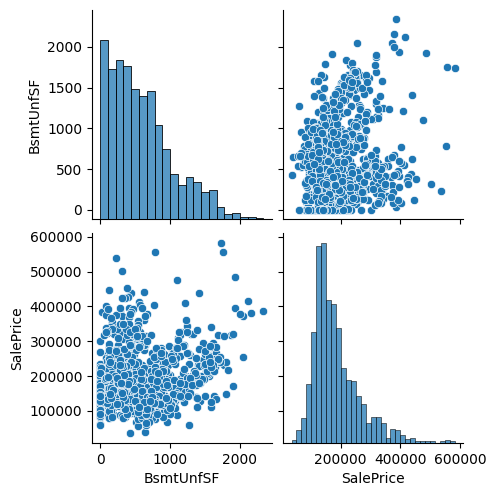

TotalBsmtSF


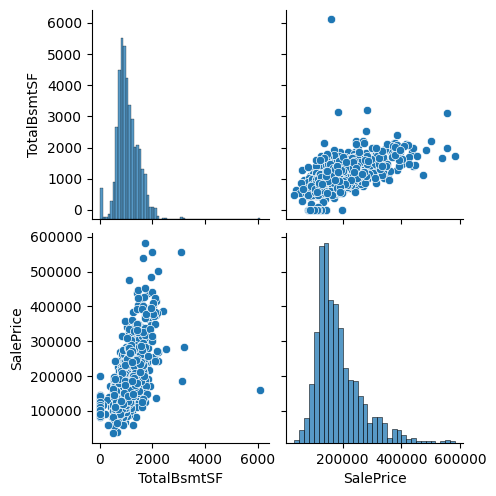

1stFlrSF


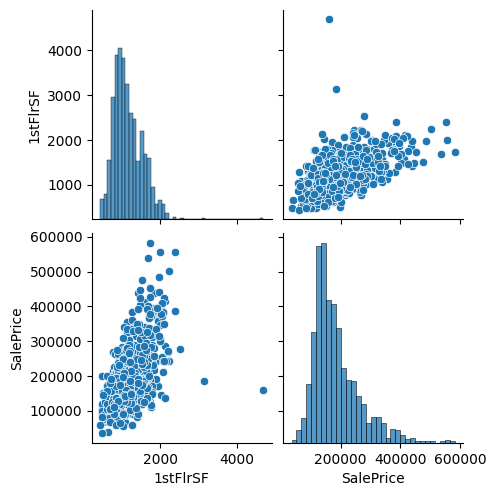

2ndFlrSF


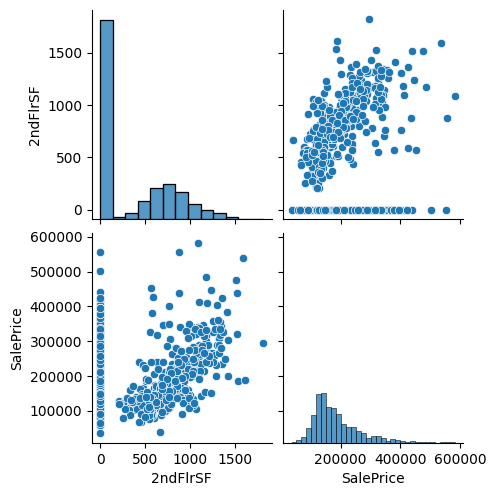

LowQualFinSF


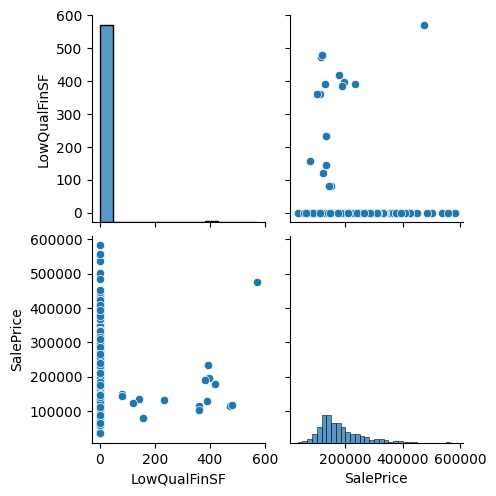

GrLivArea


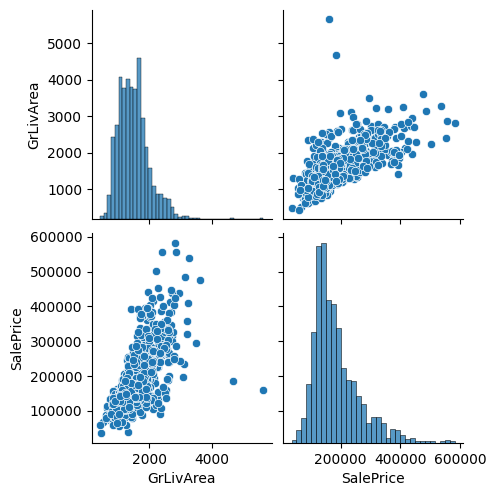

BsmtFullBath


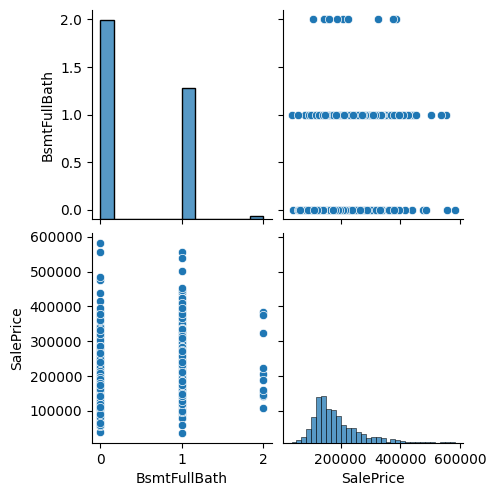

BsmtHalfBath


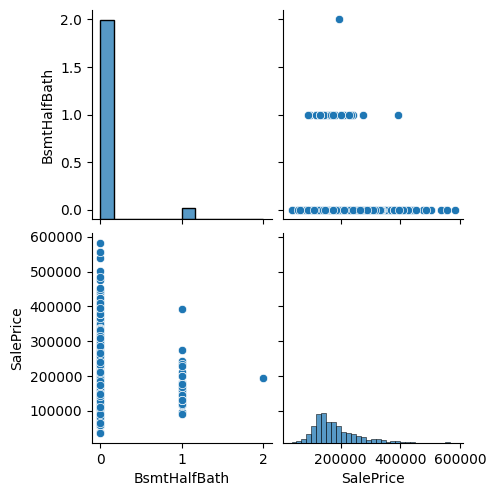

BsmtFinSF2


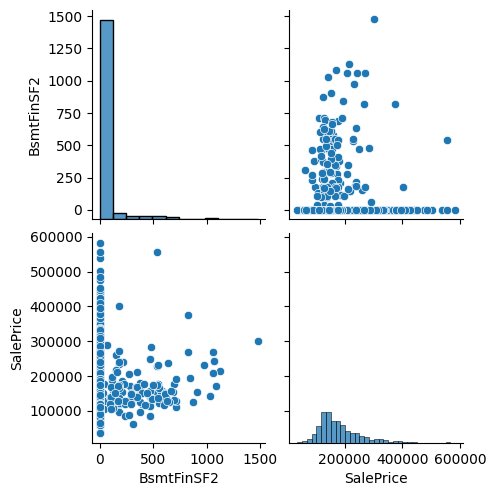

FullBath


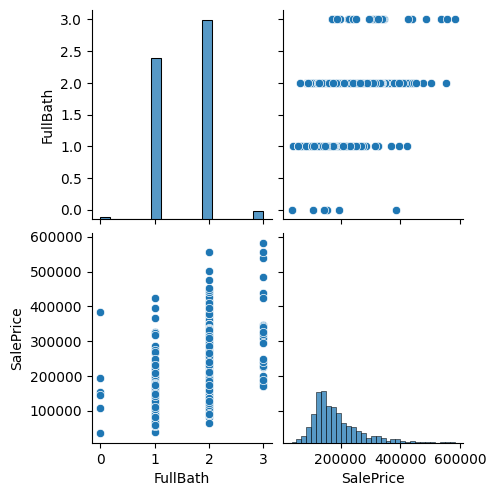

HalfBath


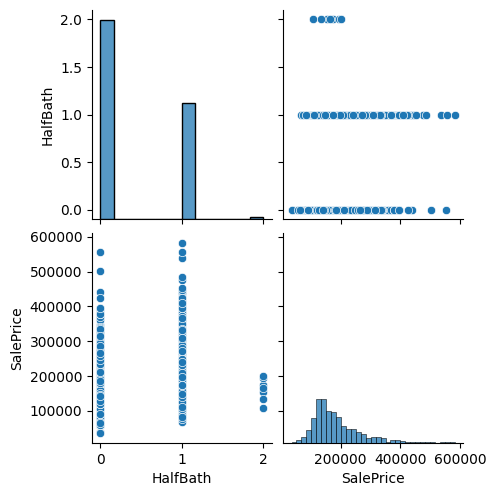

BedroomAbvGr


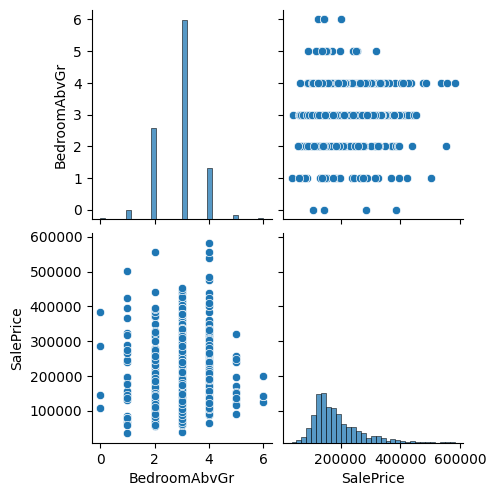

KitchenAbvGr


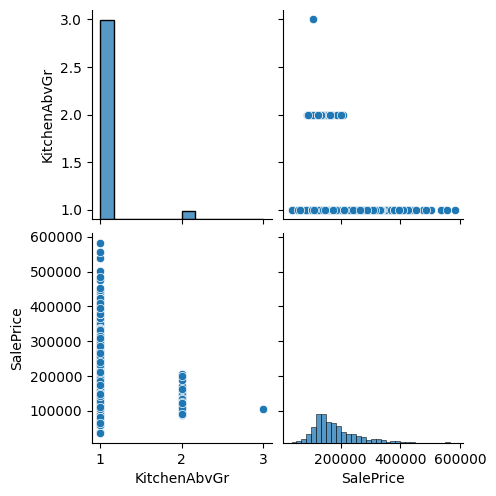

TotRmsAbvGrd


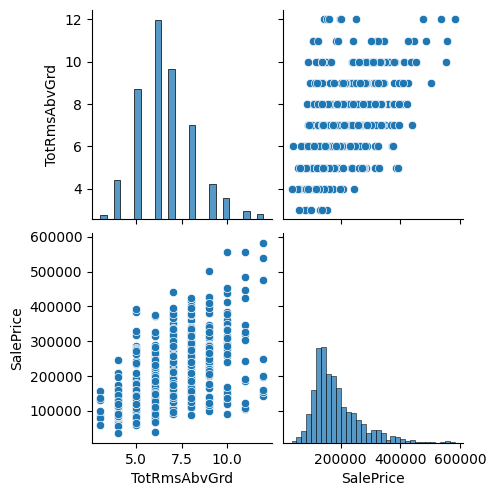

Fireplaces


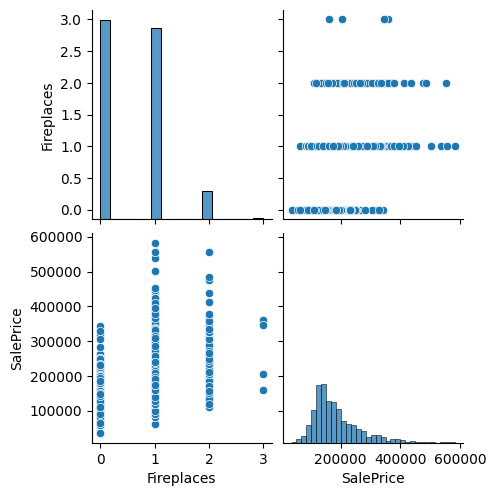

GarageYrBlt


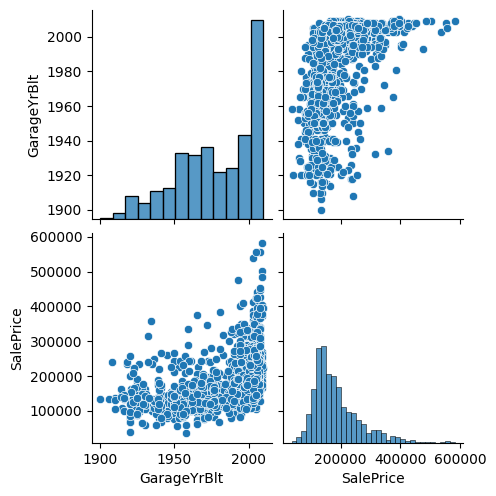

GarageCars


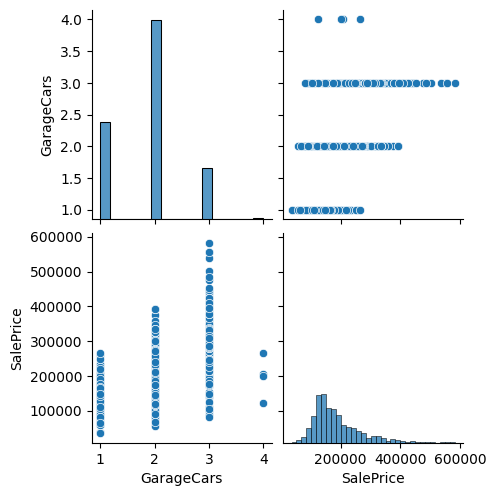

GarageArea


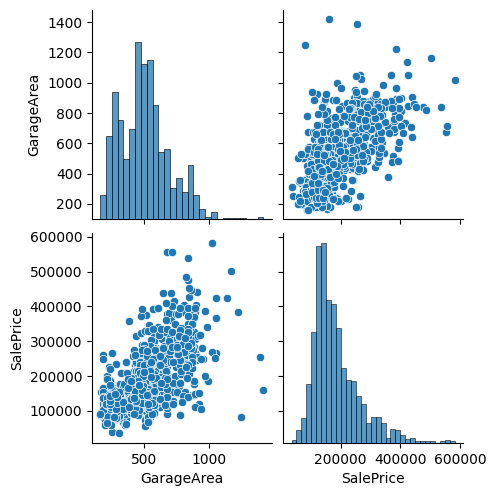

WoodDeckSF


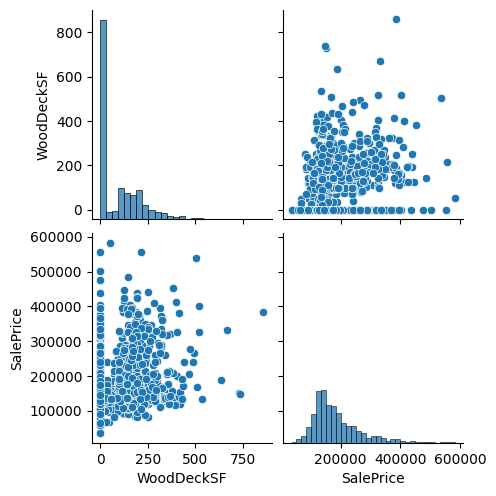

OpenPorchSF


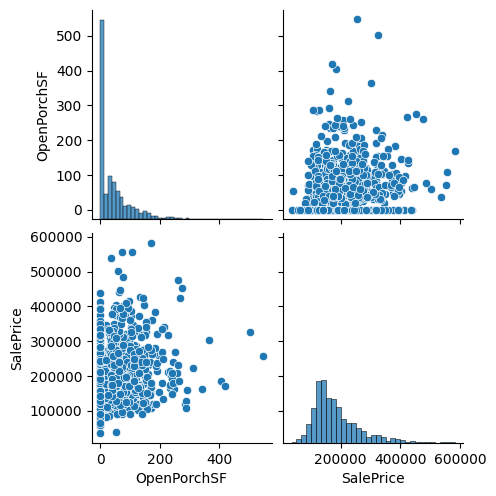

EnclosedPorch


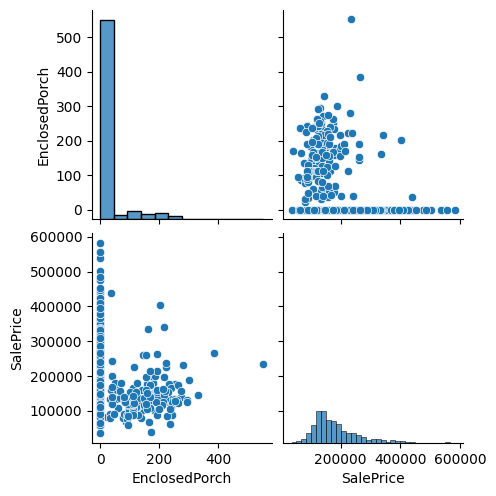

3SsnPorch


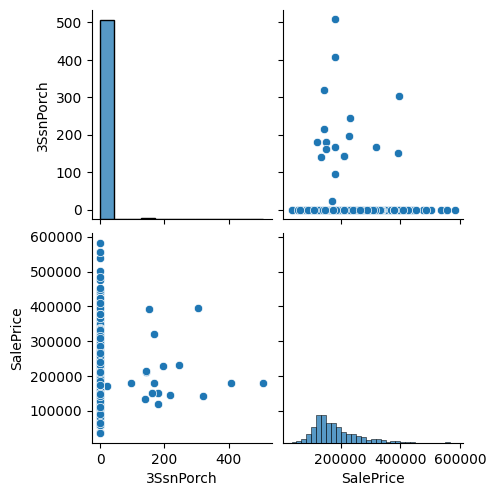

ScreenPorch


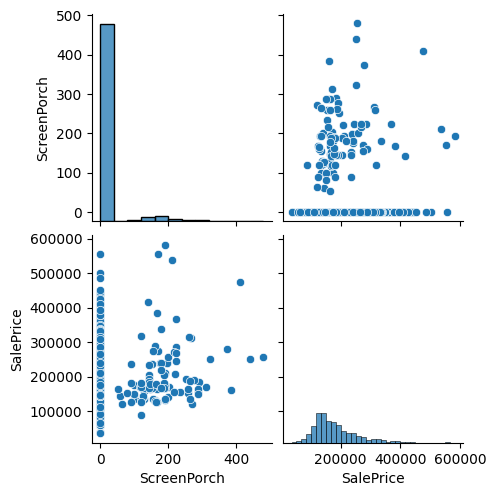

PoolArea


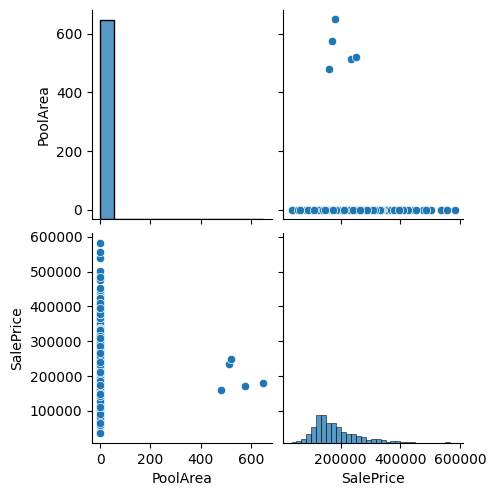

MiscVal


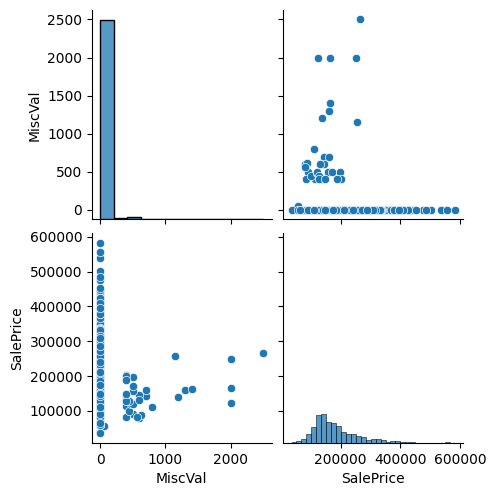

MoSold


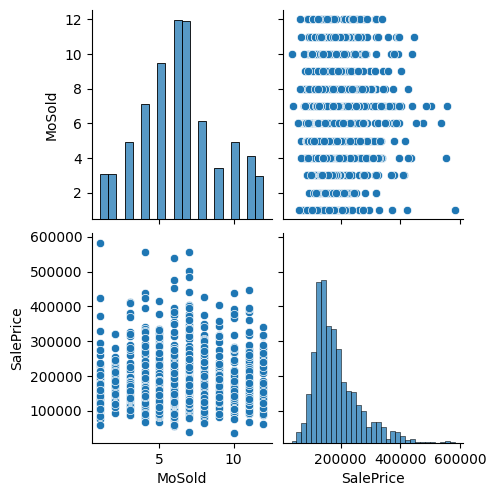

YrSold


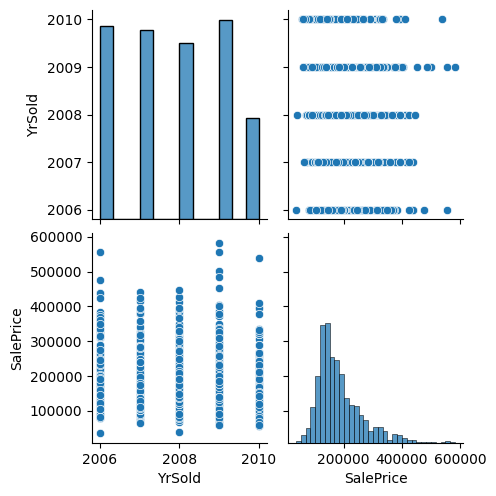

In [25]:
for categorical in Numerical_type:
    if categorical != "SalePrice":
        print(categorical)
        pd_num_houseprice = pd_housprice[[categorical, "SalePrice"]]
        sns.pairplot(pd_num_houseprice)
        plt.show()

HeatMap of the DataFrame to find correlation between variables

In [26]:
corr = pd_housprice.corr()
print(pd_housprice.shape)
plt.figure(figsize=(150, 150))
sns.heatmap(corr, annot=True)
plt.show()

(1116, 191)


Get the Correlation Values of all variables towards SalePrice

In [27]:
corr["SalePrice"]

LotFrontage    0.323666
LotArea        0.292126
OverallQual    0.806227
OverallCond   -0.127697
YearBuilt      0.545866
                 ...   
AdjLand       -0.022316
Alloca        -0.038750
Family        -0.059511
Normal        -0.186334
Partial        0.391714
Name: SalePrice, Length: 191, dtype: float64

# **Model Building**

Spliting test and train dataset from given data set and do scaling for the training dataset

In [28]:
X = pd_housprice.drop("SalePrice", axis=1)
y = pd_housprice["SalePrice"]
X.shape, y.shape

((1116, 190), (1116,))

In [29]:
cols = X.columns
X = pd.DataFrame(scale(X))
X.columns = cols
X.columns

Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       ...
       'ConLI', 'ConLw', 'New', 'Oth', 'WD', 'AdjLand', 'Alloca', 'Family',
       'Normal', 'Partial'],
      dtype='object', length=190)

In [30]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, train_size=0.7, test_size=0.3, random_state=100
)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((781, 190), (335, 190), (781,), (335,))

Building the linear regression model

In [31]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

In [32]:
y_train_pred = lr_model.predict(X_train)
y_test_pred = lr_model.predict(X_test)
X_train.shape, X_test.shape

((781, 190), (335, 190))

Calculate the residual from y_predict and y_target

In [33]:
res_train = y_train - y_train_pred
res_test = y_test - y_test_pred

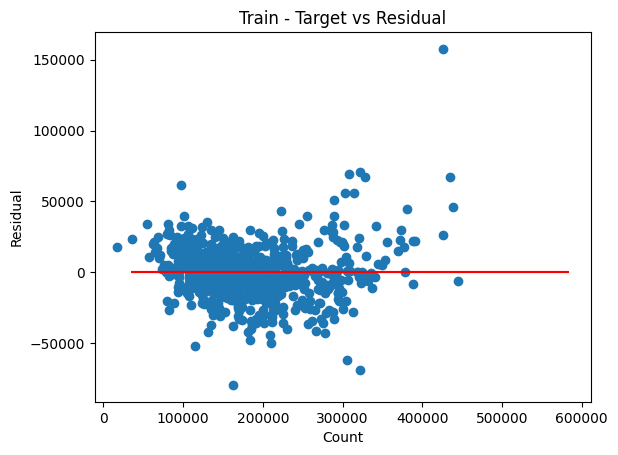

In [34]:
plt.scatter(y_train_pred, res_train)
plt.plot(y_train, (y_train - y_train), "-r")
plt.title("Train - Target vs Residual")
plt.xlabel("Count")
plt.ylabel("Residual")
plt.show()

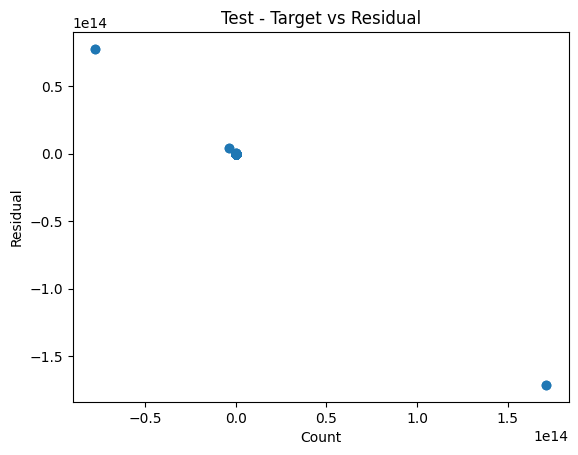

In [35]:
plt.scatter(y_test_pred, res_test)
plt.plot(y_test, (y_test - y_test), "-r")
plt.title("Test - Target vs Residual")
plt.xlabel("Count")
plt.ylabel("Residual")
plt.show()

<Axes: title={'center': 'Train - Normal distrbution of error term'}, xlabel='SalePrice', ylabel='Density'>

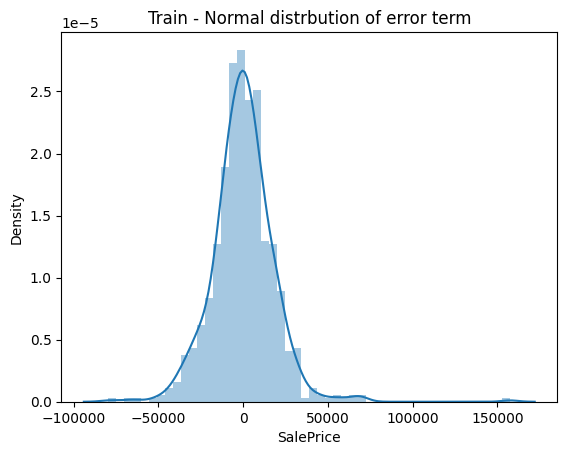

In [36]:
plt.title("Train - Normal distrbution of error term")
sns.distplot(res_train)

<Axes: title={'center': 'Test - Normal distrbution of error term'}, xlabel='SalePrice', ylabel='Density'>

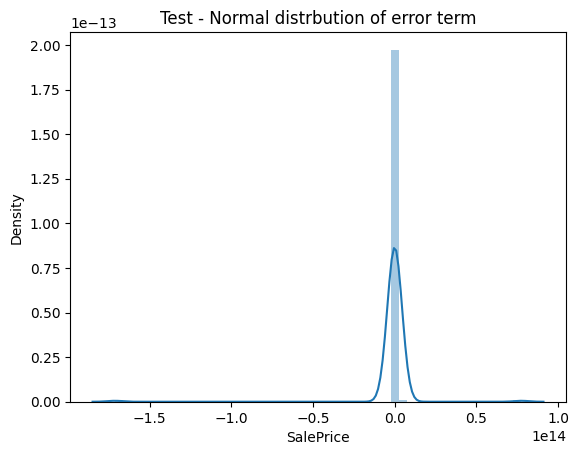

In [37]:
plt.title("Test - Normal distrbution of error term")
sns.distplot(res_test)

Calculate the metrics for the train and test model

In [38]:
print("Train Metrics")
print("r2: ", r2_score(y_train, y_train_pred))
print("MSE: ", mean_squared_error(y_train, y_train_pred))
print("RMSE: ", np.sqrt(mean_squared_error(y_train, y_train_pred)))
print("Test Metrics")
print("r2: ", r2_score(y_test, y_test_pred))
print("MSE: ", mean_squared_error(y_test, y_test_pred))
print("RMSE: ", np.sqrt(mean_squared_error(y_test, y_test_pred)))

Train Metrics
r2:  0.9344435863170709
MSE:  334364681.27670383
RMSE:  18285.64139637174
Test Metrics
r2:  -2.6462450287374016e+16
MSE:  2.1122643717304338e+26
RMSE:  14533631245254.69


Model did well on the training set and not on the test set, hence the model is overfitting to avoid it we will use the regularization technique to reduce complex of the model and overfitting by adding penalty (Lasso and rigid regression)

Model building using **Rigid Regression**

In [39]:
k_folds = KFold(n_splits=5, shuffle=False, random_state=None)

In [40]:
params = {
    "alpha": [
        0.0001,
        0.001,
        0.01,
        0.05,
        0.1,
        0.2,
        0.3,
        0.4,
        0.5,
        0.6,
        0.7,
        0.8,
        0.9,
        1.0,
        2.0,
        3.0,
        4.0,
        5.0,
        6.0,
        7.0,
        8.0,
        9.0,
        10.0,
        20,
        50,
        100,
        500,
        1000,
    ]
}

r_model = Ridge()

model_rcv = GridSearchCV(
    estimator=r_model,
    param_grid=params,
    scoring="neg_mean_absolute_error",
    cv=k_folds,
    return_train_score=True,
    verbose=1,
)


model_rcv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
             estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [41]:
model_rcv.best_params_

{'alpha': 100}

In [42]:
best_alpha = model_rcv.best_params_.get("alpha")
best_alpha

100

Selecting the best hyperparameter for alpha and train and test the ridge model

In [43]:
best_r_model = Ridge(alpha=best_alpha)
best_r_model.fit(X_train, y_train)

Ridge(alpha=100)

In [44]:
y_r_train_pred = best_r_model.predict(X_train)
y_r_test_pred = best_r_model.predict(X_test)

In [45]:
res_r_train = y_train - y_r_train_pred
res_r_test = y_test - y_r_test_pred

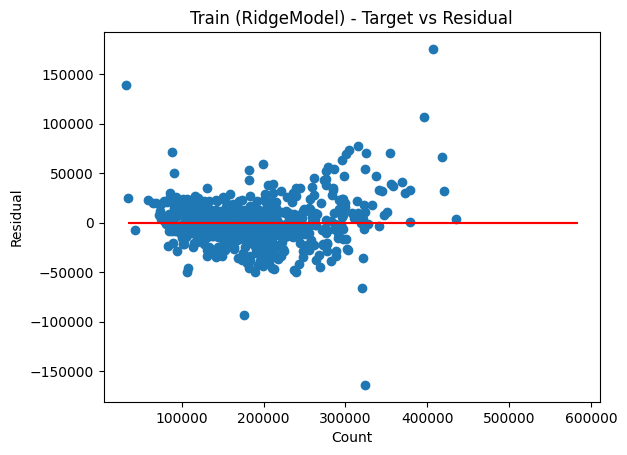

In [46]:
plt.scatter(y_r_train_pred, res_r_train)
plt.plot(y_train, (y_train - y_train), "-r")
plt.title("Train (RidgeModel) - Target vs Residual")
plt.xlabel("Count")
plt.ylabel("Residual")
plt.show()

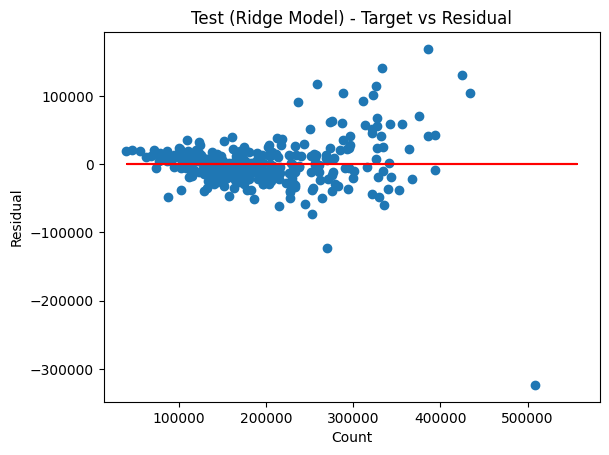

In [47]:
plt.scatter(y_r_test_pred, res_r_test)
plt.plot(y_test, (y_test - y_test), "-r")
plt.title("Test (Ridge Model) - Target vs Residual")
plt.xlabel("Count")
plt.ylabel("Residual")
plt.show()

<Axes: title={'center': 'Train (Ridge Model)- Normal distrbution of error term'}, xlabel='SalePrice', ylabel='Density'>

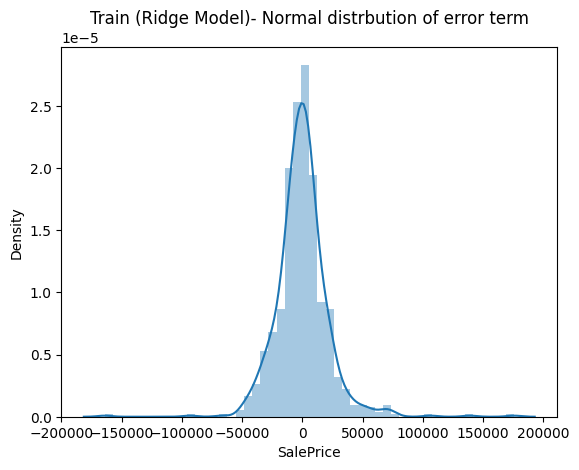

In [48]:
plt.title("Train (Ridge Model)- Normal distrbution of error term")
sns.distplot(res_r_train)

<Axes: title={'center': 'Test (Ridge Model)- Normal distrbution of error term'}, xlabel='SalePrice', ylabel='Density'>

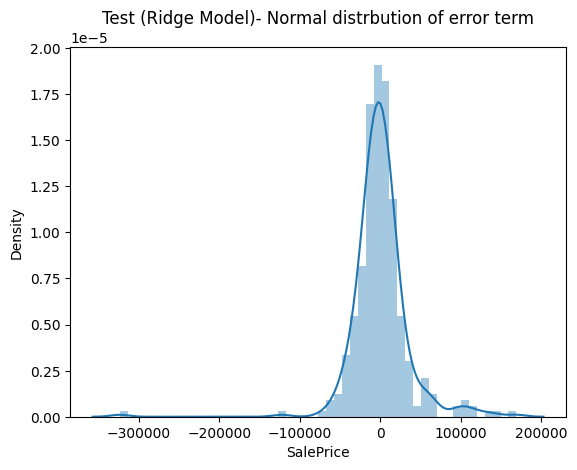

In [49]:
plt.title("Test (Ridge Model)- Normal distrbution of error term")
sns.distplot(res_r_test)

In [50]:
print("Train Metrics - Ridge Model")
print("r2: ", r2_score(y_train, y_r_train_pred))
print("MSE: ", mean_squared_error(y_train, y_r_train_pred))
print("RMSE: ", np.sqrt(mean_squared_error(y_train, y_r_train_pred)))
print("Test Metrics - Ridge Model")
print("r2: ", r2_score(y_test, y_r_test_pred))
print("MSE: ", mean_squared_error(y_test, y_r_test_pred))
print("RMSE: ", np.sqrt(mean_squared_error(y_test, y_r_test_pred)))

Train Metrics - Ridge Model
r2:  0.9051784905138883
MSE:  483628710.2409887
RMSE:  21991.559977431993
Test Metrics - Ridge Model
r2:  0.839302471242001
MSE:  1282706857.9609296
RMSE:  35814.897151338155


**Ridge Model Metrics** for Train and Test

Train Metrics

r2:  0.9051784905138883

MSE:  483628710.2409887

RMSE:  21991.559977431993

Test Metrics

r2:  0.839302471242001

MSE:  1282706857.9609296

RMSE:  35814.897151338155


Model Builiding using **Lasso Regression**

In [51]:
l_model = Lasso()

model_lcv = GridSearchCV(
    estimator=l_model,
    param_grid=params,
    scoring="neg_mean_absolute_error",
    cv=k_folds,
    return_train_score=True,
    verbose=1,
)


model_lcv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
             estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [52]:
model_lcv.best_params_

{'alpha': 500}

In [53]:
best_alpha = model_lcv.best_params_.get("alpha")
best_alpha

500

Selecting the best hyperparameter for alpha and train and test the ridge model

In [54]:
best_l_model = Lasso(alpha=best_alpha)
best_l_model.fit(X_train, y_train)

Lasso(alpha=500)

In [55]:
y_l_train_pred = best_l_model.predict(X_train)
y_l_test_pred = best_l_model.predict(X_test)

In [56]:
res_l_train = y_train - y_l_train_pred
res_l_test = y_test - y_l_test_pred

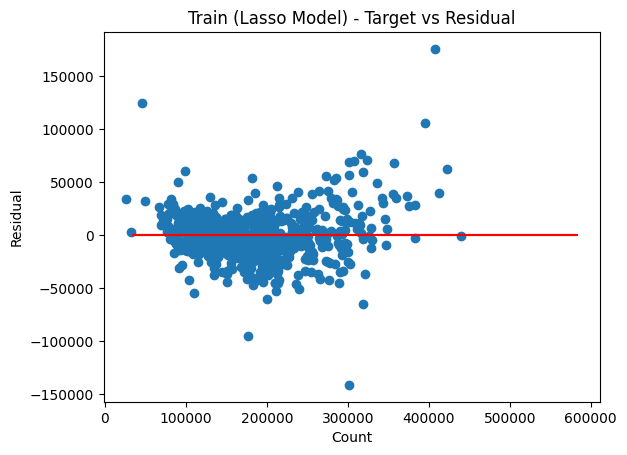

In [57]:
plt.scatter(y_l_train_pred, res_l_train)
plt.plot(y_train, (y_train - y_train), "-r")
plt.title("Train (Lasso Model) - Target vs Residual")
plt.xlabel("Count")
plt.ylabel("Residual")
plt.show()

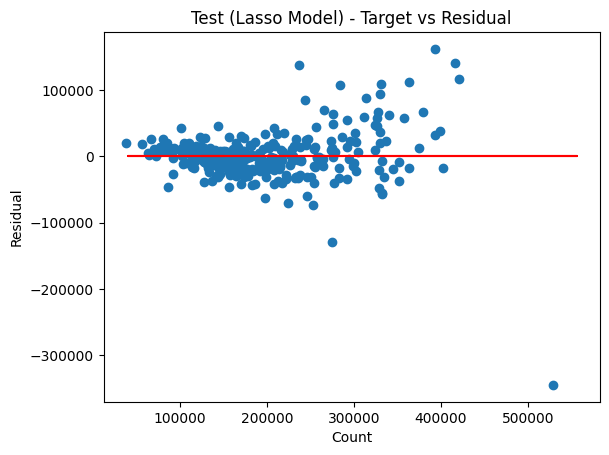

In [58]:
plt.scatter(y_l_test_pred, res_l_test)
plt.plot(y_test, (y_test - y_test), "-r")
plt.title("Test (Lasso Model) - Target vs Residual")
plt.xlabel("Count")
plt.ylabel("Residual")
plt.show()

<Axes: title={'center': 'Train (Lasso Model)- Normal distrbution of error term'}, xlabel='SalePrice', ylabel='Density'>

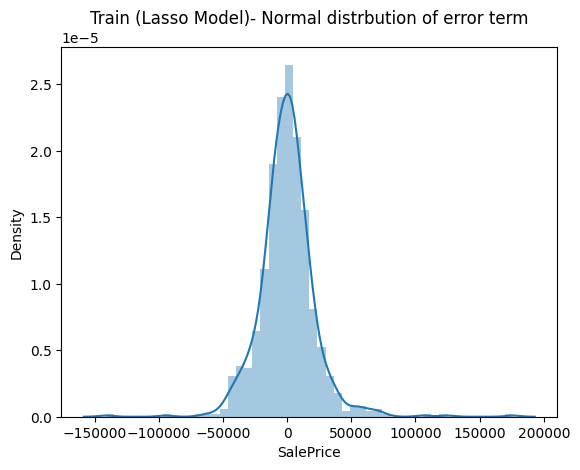

In [59]:
plt.title("Train (Lasso Model)- Normal distrbution of error term")
sns.distplot(res_l_train)

<Axes: title={'center': 'Test (Lasso Model)- Normal distrbution of error term'}, xlabel='SalePrice', ylabel='Density'>

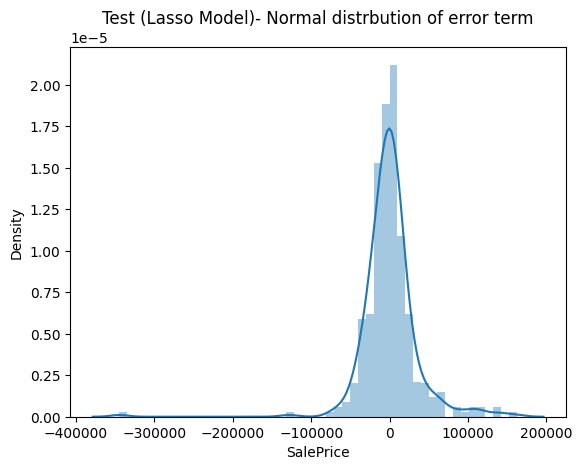

In [60]:
plt.title("Test (Lasso Model)- Normal distrbution of error term")
sns.distplot(res_l_test)

In [61]:
print("Train Metrics - Lasso Model")
print("r2: ", r2_score(y_train, y_l_train_pred))
print("MSE: ", mean_squared_error(y_train, y_l_train_pred))
print("RMSE: ", np.sqrt(mean_squared_error(y_train, y_l_train_pred)))
print("Test Metrics - Lasso Model")
print("r2: ", r2_score(y_test, y_l_test_pred))
print("MSE: ", mean_squared_error(y_test, y_l_test_pred))
print("RMSE: ", np.sqrt(mean_squared_error(y_test, y_l_test_pred)))

Train Metrics - Lasso Model
r2:  0.9077107663800178
MSE:  470713061.4842059
RMSE:  21695.92269262144
Test Metrics - Lasso Model
r2:  0.8342302576489576
MSE:  1323193872.3607414
RMSE:  36375.73191512085


Lasso Model Metrics for Train and Test

Train Metrics

r2:  0.9077107663800178

MSE:  470713061.4842059

RMSE:  21695.92269262144

Test Metrics

r2:  0.8342302576489576

MSE:  1323193872.3607414

RMSE:  36375.73191512085

# **Observe the coefficient after the regularization**

In [62]:
betas = pd.DataFrame(index=X.columns)

In [63]:
betas.rows = X.columns

In [64]:
betas["Linear"] = lr_model.coef_
betas["Ridge"] = best_r_model.coef_
betas["Lasso"] = best_l_model.coef_

In [65]:
pd.set_option("display.max_rows", None)
betas.head(len(betas.rows))

,Linear,Ridge,Lasso
LotFrontage,2.257890e+03,-1.748478e+02,0.000000
LotArea,7.933252e+03,1.563898e+03,0.000000
OverallQual,1.206668e+04,1.176699e+04,16166.155327
OverallCond,6.889331e+03,4.832615e+03,5228.592801
YearBuilt,1.314008e+04,4.174320e+03,5710.852228
YearRemodAdd,1.931132e+03,3.180341e+03,2336.773469
MasVnrArea,4.715824e+03,4.599165e+03,4950.672589
BsmtFinSF1,-2.231642e+16,3.013483e+03,3005.811156
BsmtFinSF2,-7.643237e+15,1.076652e+01,-0.000000
BsmtUnfSF,-2.178508e+16,7.718630e+02,0.000000


Plot for model coefficient for linear, rigid and lasso

In [66]:
def model_feature_plot(model_coefficient):
    importance = model_coefficient
    for i, v in enumerate(importance):
        print("Feature: %s, Score: %.5f" % (X.columns[i], v))
        # plot feature importance
    plt.figure(figsize=(10, 10))
    plt.bar([x for x in range(len(importance))], importance)
    plt.show()

Feature: LotFrontage, Score: 2257.88990
Feature: LotArea, Score: 7933.25172
Feature: OverallQual, Score: 12066.67505
Feature: OverallCond, Score: 6889.33122
Feature: YearBuilt, Score: 13140.08493
Feature: YearRemodAdd, Score: 1931.13231
Feature: MasVnrArea, Score: 4715.82433
Feature: BsmtFinSF1, Score: -22316416745369464.00000
Feature: BsmtFinSF2, Score: -7643236591120563.00000
Feature: BsmtUnfSF, Score: -21785078227652272.00000
Feature: TotalBsmtSF, Score: 21273038860843860.00000
Feature: 1stFlrSF, Score: 14099037954815136.00000
Feature: 2ndFlrSF, Score: 15978747796468416.00000
Feature: LowQualFinSF, Score: 1542720884681326.25000
Feature: GrLivArea, Score: -18729631188026836.00000
Feature: BsmtFullBath, Score: 2620.65181
Feature: BsmtHalfBath, Score: 192.14053
Feature: FullBath, Score: 3765.89135
Feature: HalfBath, Score: 1283.15611
Feature: BedroomAbvGr, Score: -4868.09755
Feature: KitchenAbvGr, Score: -2556.14110
Feature: TotRmsAbvGrd, Score: 2746.43612
Feature: Fireplaces, Score: 5

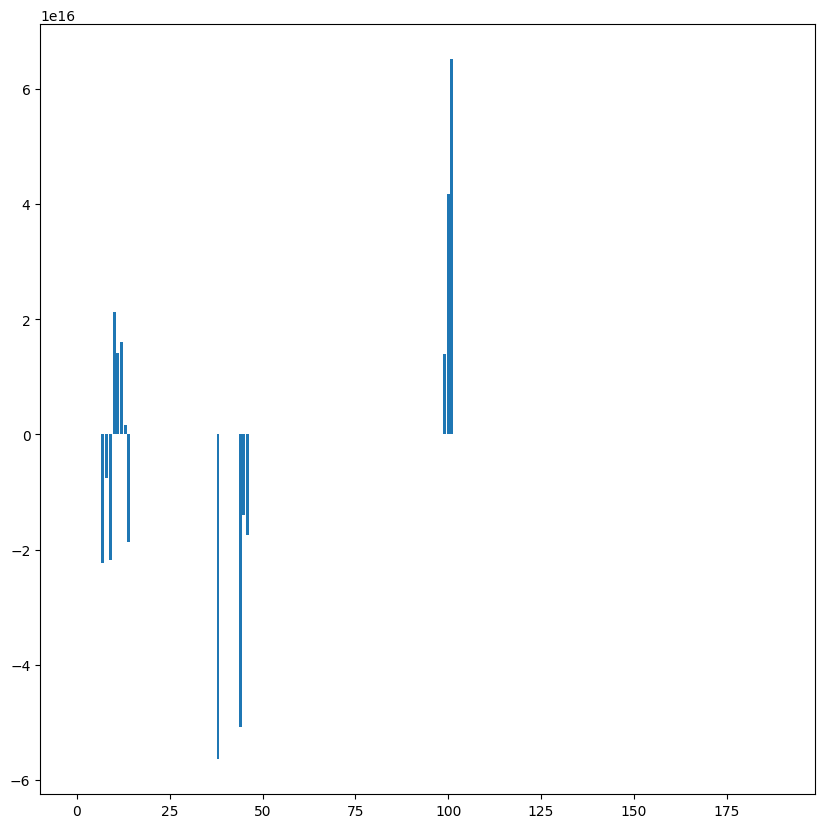

In [67]:
model_feature_plot(lr_model.coef_)

Feature: LotFrontage, Score: -174.84775
Feature: LotArea, Score: 1563.89774
Feature: OverallQual, Score: 11766.99306
Feature: OverallCond, Score: 4832.61465
Feature: YearBuilt, Score: 4174.32044
Feature: YearRemodAdd, Score: 3180.34066
Feature: MasVnrArea, Score: 4599.16536
Feature: BsmtFinSF1, Score: 3013.48347
Feature: BsmtFinSF2, Score: 10.76652
Feature: BsmtUnfSF, Score: 771.86299
Feature: TotalBsmtSF, Score: 3955.59563
Feature: 1stFlrSF, Score: 6894.41865
Feature: 2ndFlrSF, Score: 4506.07956
Feature: LowQualFinSF, Score: -237.64490
Feature: GrLivArea, Score: 9014.56935
Feature: BsmtFullBath, Score: 4041.36945
Feature: BsmtHalfBath, Score: -371.74332
Feature: FullBath, Score: 4351.73983
Feature: HalfBath, Score: 2036.81286
Feature: BedroomAbvGr, Score: -1545.56672
Feature: KitchenAbvGr, Score: -3386.16986
Feature: TotRmsAbvGrd, Score: 5550.66457
Feature: Fireplaces, Score: 2959.75564
Feature: GarageYrBlt, Score: -76.66392
Feature: GarageCars, Score: 5583.79148
Feature: GarageArea, 

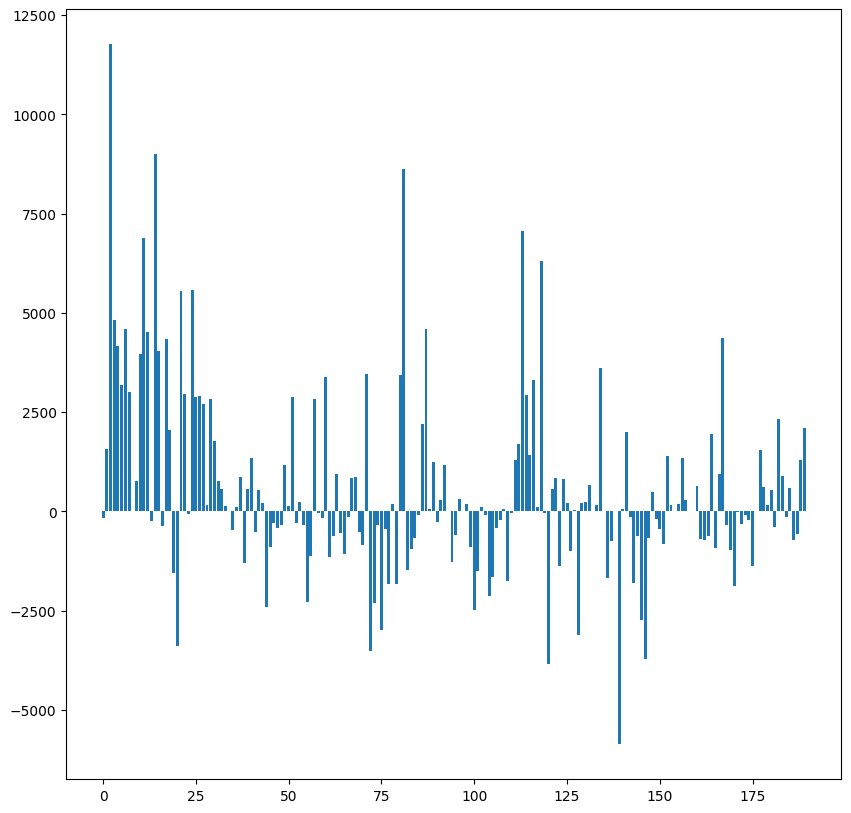

In [68]:
model_feature_plot(best_r_model.coef_)

Feature: LotFrontage, Score: 0.00000
Feature: LotArea, Score: 0.00000
Feature: OverallQual, Score: 16166.15533
Feature: OverallCond, Score: 5228.59280
Feature: YearBuilt, Score: 5710.85223
Feature: YearRemodAdd, Score: 2336.77347
Feature: MasVnrArea, Score: 4950.67259
Feature: BsmtFinSF1, Score: 3005.81116
Feature: BsmtFinSF2, Score: -0.00000
Feature: BsmtUnfSF, Score: 0.00000
Feature: TotalBsmtSF, Score: 3243.11555
Feature: 1stFlrSF, Score: 3190.12266
Feature: 2ndFlrSF, Score: 0.00000
Feature: LowQualFinSF, Score: -481.86902
Feature: GrLivArea, Score: 20475.61176
Feature: BsmtFullBath, Score: 3703.94505
Feature: BsmtHalfBath, Score: -0.00000
Feature: FullBath, Score: 2728.32714
Feature: HalfBath, Score: 650.02426
Feature: BedroomAbvGr, Score: -1513.94091
Feature: KitchenAbvGr, Score: -5041.77889
Feature: TotRmsAbvGrd, Score: 3355.73925
Feature: Fireplaces, Score: 2028.60005
Feature: GarageYrBlt, Score: -0.00000
Feature: GarageCars, Score: 6466.74776
Feature: GarageArea, Score: 1691.66

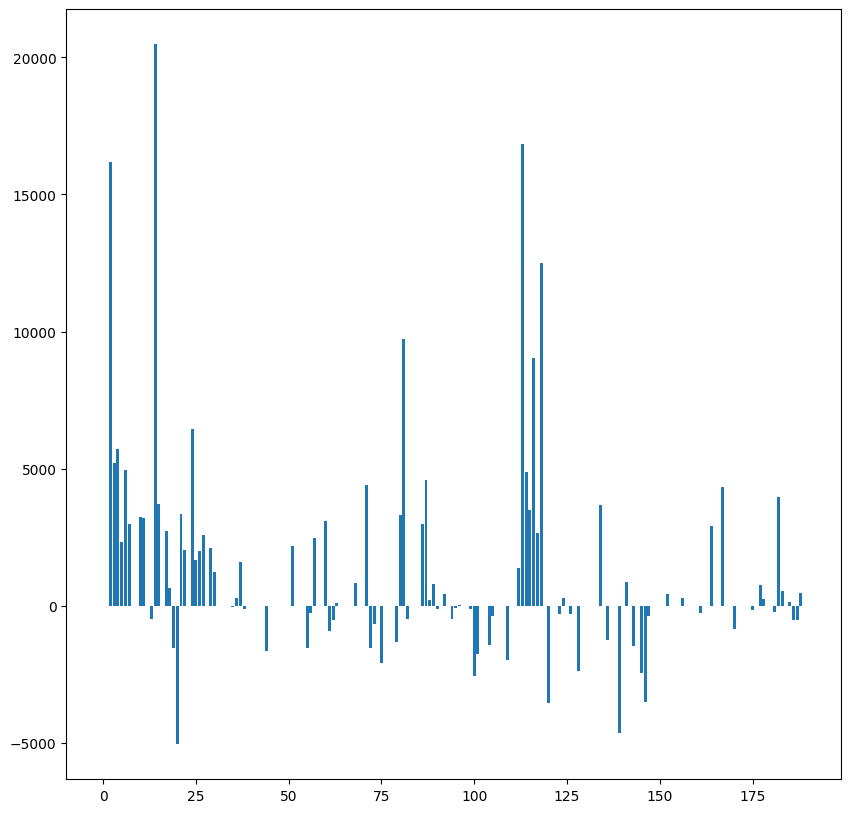

In [69]:
model_feature_plot(best_l_model.coef_)

# **Question 1**
What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?


In [70]:
best_ridge_alpha = model_rcv.best_params_.get("alpha")
best_lasso_alpha = model_lcv.best_params_.get("alpha")
ridge_double_alpha = best_ridge_alpha * 2
lasso_double_alpha = best_lasso_alpha * 2
print(best_ridge_alpha, ridge_double_alpha)
print(best_lasso_alpha, lasso_double_alpha)

100 200
500 1000


Build Ridge Model with Double alpha

In [71]:
best_r_doualp_model = Ridge(alpha=ridge_double_alpha)
best_r_doualp_model.fit(X_train, y_train)

Ridge(alpha=200)

In [72]:
y_r_train_pred = best_r_doualp_model.predict(X_train)
y_r_test_pred = best_r_doualp_model.predict(X_test)

In [73]:
res_r_train = y_train - y_r_train_pred
res_r_test = y_test - y_r_test_pred

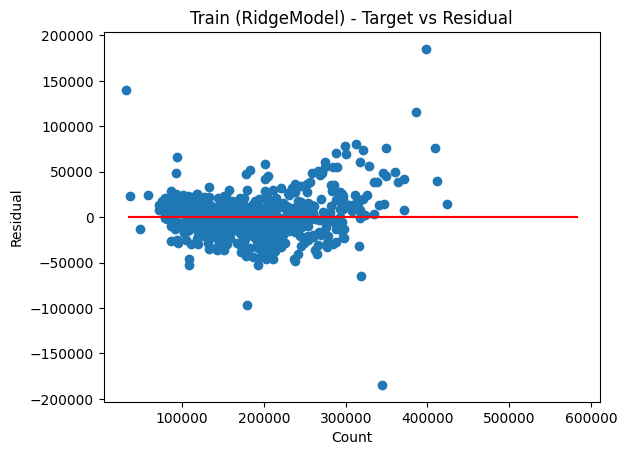

In [74]:
plt.scatter(y_r_train_pred, res_r_train)
plt.plot(y_train, (y_train - y_train), "-r")
plt.title("Train (RidgeModel) - Target vs Residual")
plt.xlabel("Count")
plt.ylabel("Residual")
plt.show()

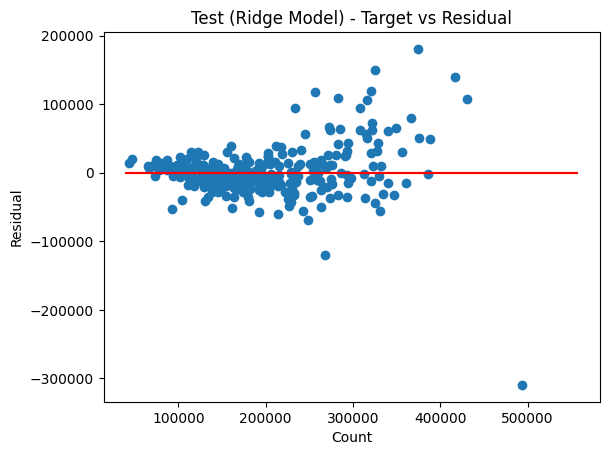

In [75]:
plt.scatter(y_r_test_pred, res_r_test)
plt.plot(y_test, (y_test - y_test), "-r")
plt.title("Test (Ridge Model) - Target vs Residual")
plt.xlabel("Count")
plt.ylabel("Residual")
plt.show()

<Axes: title={'center': 'Train (Ridge Model)- Normal distrbution of error term'}, xlabel='SalePrice', ylabel='Density'>

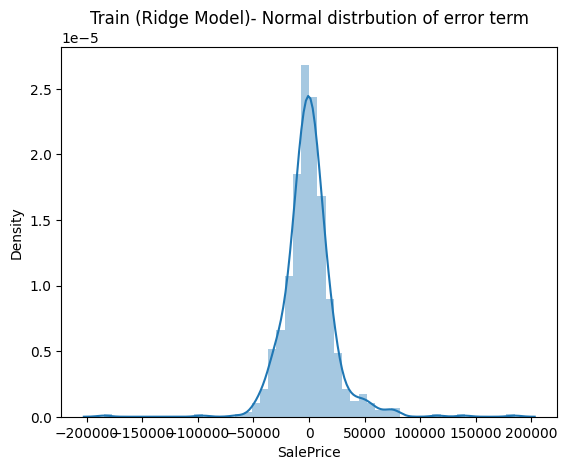

In [76]:
plt.title("Train (Ridge Model)- Normal distrbution of error term")
sns.distplot(res_r_train)

<Axes: title={'center': 'Test (Ridge Model)- Normal distrbution of error term'}, xlabel='SalePrice', ylabel='Density'>

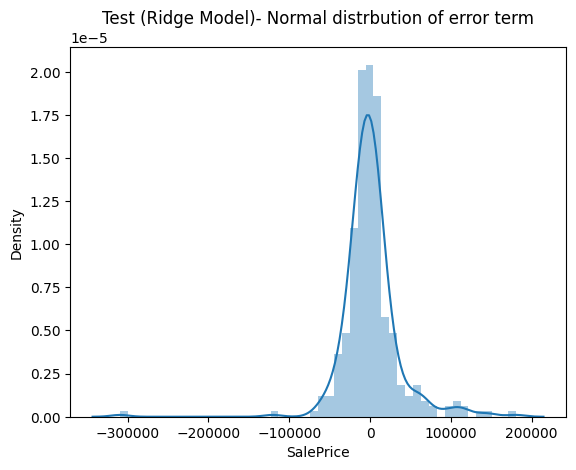

In [77]:
plt.title("Test (Ridge Model)- Normal distrbution of error term")
sns.distplot(res_r_test)

In [78]:
print("Train Metrics - Ridge Model- Double the Value of Alpha")
print("r2: ", r2_score(y_train, y_r_train_pred))
print("MSE: ", mean_squared_error(y_train, y_r_train_pred))
print("RMSE: ", np.sqrt(mean_squared_error(y_train, y_r_train_pred)))
print("Test Metrics - Ridge Model")
print("r2: ", r2_score(y_test, y_r_test_pred))
print("MSE: ", mean_squared_error(y_test, y_r_test_pred))
print("RMSE: ", np.sqrt(mean_squared_error(y_test, y_r_test_pred)))

Train Metrics - Ridge Model- Double the Value of Alpha
r2:  0.896790007010695
MSE:  526413427.3322244
RMSE:  22943.701256166678
Test Metrics - Ridge Model
r2:  0.8357013031044609
MSE:  1311451811.9275162
RMSE:  36213.972606267824


Model Building using Double Alpha for Lasso

In [79]:
best_l_doualp_model = Lasso(alpha=lasso_double_alpha)
best_l_doualp_model.fit(X_train, y_train)

Lasso(alpha=1000)

In [80]:
y_l_train_pred = best_l_doualp_model.predict(X_train)
y_l_test_pred = best_l_doualp_model.predict(X_test)

In [81]:
res_l_train = y_train - y_l_train_pred
res_l_test = y_test - y_l_test_pred

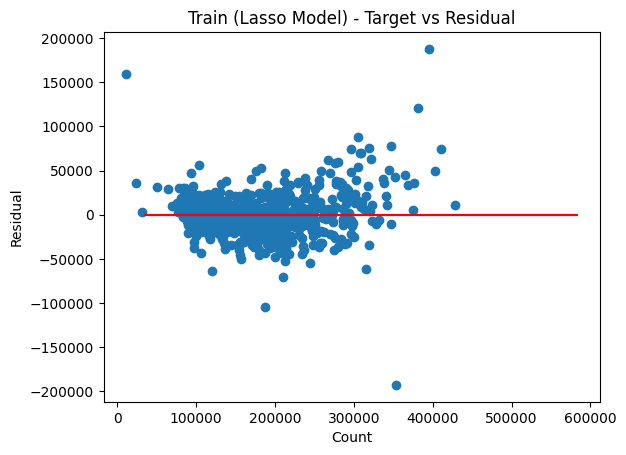

In [82]:
plt.scatter(y_l_train_pred, res_l_train)
plt.plot(y_train, (y_train - y_train), "-r")
plt.title("Train (Lasso Model) - Target vs Residual")
plt.xlabel("Count")
plt.ylabel("Residual")
plt.show()

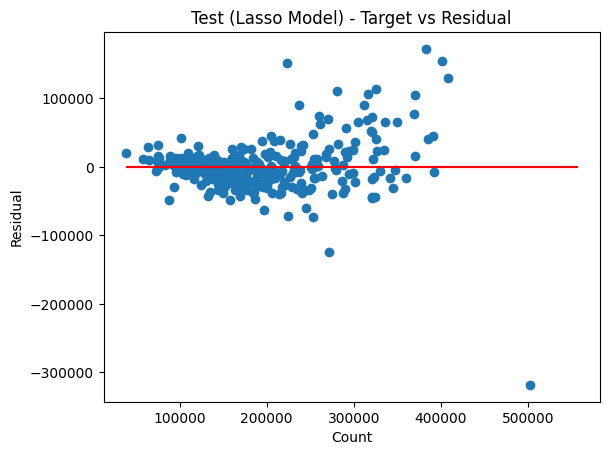

In [83]:
plt.scatter(y_l_test_pred, res_l_test)
plt.plot(y_test, (y_test - y_test), "-r")
plt.title("Test (Lasso Model) - Target vs Residual")
plt.xlabel("Count")
plt.ylabel("Residual")
plt.show()

<Axes: title={'center': 'Train (Lasso Model)- Normal distrbution of error term'}, xlabel='SalePrice', ylabel='Density'>

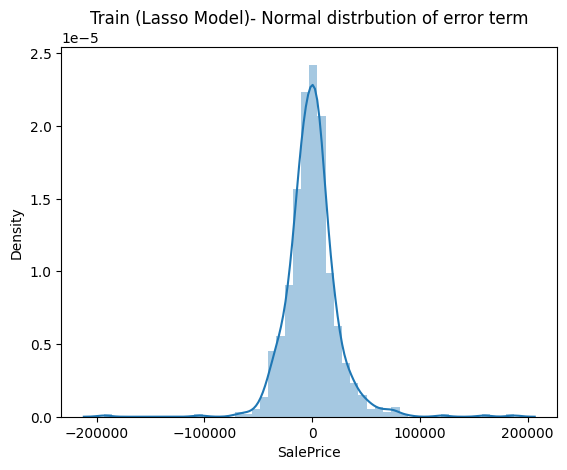

In [84]:
plt.title("Train (Lasso Model)- Normal distrbution of error term")
sns.distplot(res_l_train)

<Axes: title={'center': 'Test (Lasso Model)- Normal distrbution of error term'}, xlabel='SalePrice', ylabel='Density'>

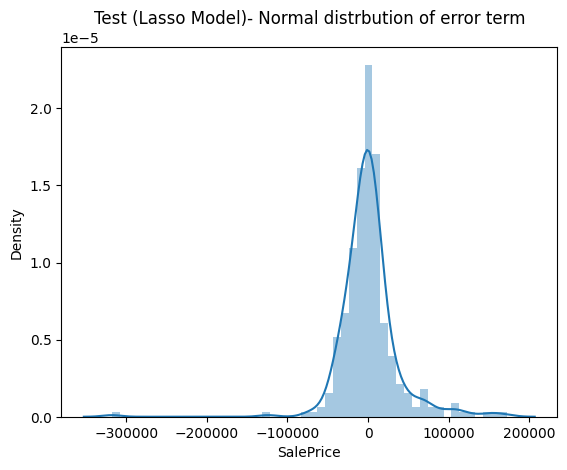

In [85]:
plt.title("Test (Lasso Model)- Normal distrbution of error term")
sns.distplot(res_l_test)

In [86]:
print("Train Metrics - Lasso Model -Double Alpha Value")
print("r2: ", r2_score(y_train, y_l_train_pred))
print("MSE: ", mean_squared_error(y_train, y_l_train_pred))
print("RMSE: ", np.sqrt(mean_squared_error(y_train, y_l_train_pred)))
print("Test Metrics - Lasso Model")
print("r2: ", r2_score(y_test, y_l_test_pred))
print("MSE: ", mean_squared_error(y_test, y_l_test_pred))
print("RMSE: ", np.sqrt(mean_squared_error(y_test, y_l_test_pred)))

Train Metrics - Lasso Model -Double Alpha Value
r2:  0.8882170059371923
MSE:  570139259.9470274
RMSE:  23877.58907316707
Test Metrics - Lasso Model
r2:  0.8288595788477778
MSE:  1366063271.6814559
RMSE:  36960.293176346095


In [87]:
betas_doualp = pd.DataFrame(index=X.columns)

In [88]:
betas_doualp.rows = X.columns

In [89]:
betas_doualp["Ridge"] = best_r_model.coef_
betas_doualp["Ridge_DoubleAlpha"] = best_r_doualp_model.coef_
betas_doualp["Lasso"] = best_l_model.coef_
betas_doualp["Lasso_DoubleAlpha"] = best_l_doualp_model.coef_

In [90]:
pd.set_option("display.max_rows", None)
betas_doualp.head(len(betas_doualp.rows))

,Ridge,Ridge_DoubleAlpha,Lasso,Lasso_DoubleAlpha
LotFrontage,-1.748478e+02,1.567840e+02,0.000000,-0.000000
LotArea,1.563898e+03,1.483277e+03,0.000000,0.000000
OverallQual,1.176699e+04,1.047892e+04,16166.155327,18683.856965
OverallCond,4.832615e+03,4.093208e+03,5228.592801,4333.961942
YearBuilt,4.174320e+03,3.240128e+03,5710.852228,4314.675519
YearRemodAdd,3.180341e+03,3.581240e+03,2336.773469,2940.263923
MasVnrArea,4.599165e+03,4.350968e+03,4950.672589,4391.679666
BsmtFinSF1,3.013483e+03,3.055284e+03,3005.811156,2375.105694
BsmtFinSF2,1.076652e+01,-7.453807e+01,-0.000000,-0.000000
BsmtUnfSF,7.718630e+02,9.452712e+02,0.000000,0.000000


In [91]:
betas_doualp.nlargest(5, "Ridge_DoubleAlpha")

,Ridge,Ridge_DoubleAlpha,Lasso,Lasso_DoubleAlpha
OverallQual,11766.993063,10478.924517,16166.155327,18683.856965
GrLivArea,9014.569350,7805.887719,20475.611757,18773.710211
NridgHt,8617.202441,7701.177577,9740.040289,9539.922381
1stFlrSF,6894.418646,6253.769608,3190.122658,2632.290244
GarageCars,5583.791479,5230.735370,6466.747758,7691.230922


In [92]:
betas_doualp.nlargest(5, "Lasso_DoubleAlpha")

,Ridge,Ridge_DoubleAlpha,Lasso,Lasso_DoubleAlpha
GrLivArea,9014.569350,7805.887719,20475.611757,18773.710211
OverallQual,11766.993063,10478.924517,16166.155327,18683.856965
NridgHt,8617.202441,7701.177577,9740.040289,9539.922381
GarageCars,5583.791479,5230.735370,6466.747758,7691.230922
StoneBr,4593.634751,4231.937584,4600.530207,4497.047998


**Question 3**

After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?


In [93]:
betas_doualp.nlargest(5, "Lasso")

,Ridge,Ridge_DoubleAlpha,Lasso,Lasso_DoubleAlpha
GrLivArea,9014.569350,7805.887719,20475.611757,18773.710211
CompShg,7064.412301,3893.825206,16851.611275,1991.942206
OverallQual,11766.993063,10478.924517,16166.155327,18683.856965
WdShngl,6299.021671,4254.111927,12509.057765,3778.271175
NridgHt,8617.202441,7701.177577,9740.040289,9539.922381


In [94]:
lasso_imp_features = ["GrLivArea", "CompShg", "OverallQual", "WdShngl", "NridgHt"]

In [95]:
X_train = X_train.drop(lasso_imp_features, axis=1)

In [96]:
X_train.shape

(781, 185)

In [97]:
lasso_model = Lasso(alpha=500)
lasso_model.fit(X_train, y_train)

Lasso(alpha=500)

In [98]:
y_l_train_pred = lasso_model.predict(X_train)

In [99]:
print("Train Metrics - Lasso Model-Removal of top 5 Features")
print("r2: ", r2_score(y_train, y_l_train_pred))
print("MSE: ", mean_squared_error(y_train, y_l_train_pred))
print("RMSE: ", np.sqrt(mean_squared_error(y_train, y_l_train_pred)))

Train Metrics - Lasso Model-Removal of top 5 Features
r2:  0.8792438519666985
MSE:  615906036.9690634
RMSE:  24817.454280587754


In [100]:
betas_lasso = pd.DataFrame(index=X_train.columns)

In [101]:
betas_lasso.rows = X.columns

In [102]:
betas_lasso["Lasso"] = lasso_model.coef_

In [103]:
betas_lasso.nlargest(5, "Lasso")

,Lasso
1stFlrSF,17929.977299
2ndFlrSF,14935.117049
YearBuilt,12130.617957
TotRmsAbvGrd,6824.538422
MasVnrArea,6607.644734
